# Lab 2 — Exploring Image Data
### Resubmission by Eddie Diaz

## Chosen Dataset
https://www.kaggle.com/datasets/paultimothymooney/chest-xray-pneumonia

## Business Understanding

This dataset is publicly available on Kaggle for research purposes. It consists of over 5,500 images of chest X-Ray scans for pneumonia diagnosis. The purpose of this dataset is to train machines to diagnose viral or bacterial pneumonia. By recognizing the key patterns in infected and healthy lungs, machines can potentially identify the presence of lung disease. However, this purpose requires very high accuracy, as the risk of misdiagnosis could potentially spell human death. For this reason, we expect at least 95% accuracy.

## Data Preparation

To begin working with image data, I will first import our dependencies and load some images.

Working with 1583 healthy images
Image examples: 
NORMAL2-IM-0875-0001.jpeg


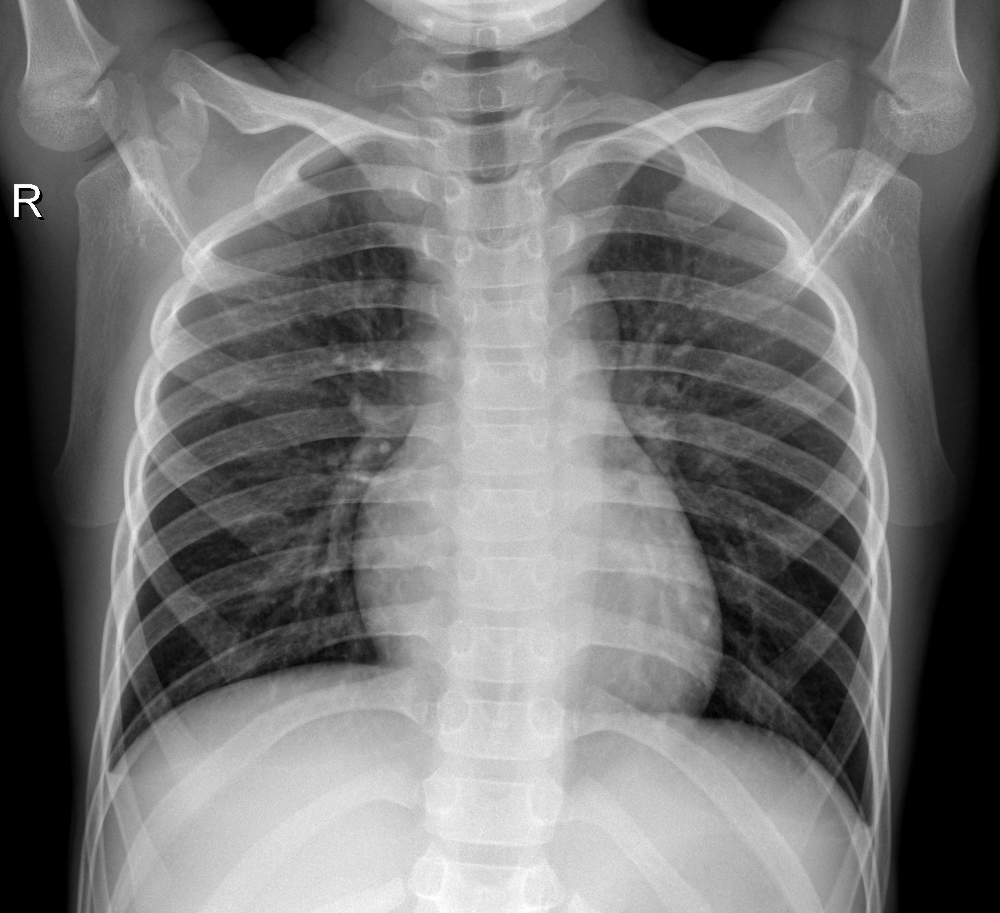

Working with 4273 infections
Image examples: 
person505_virus_1017.jpeg


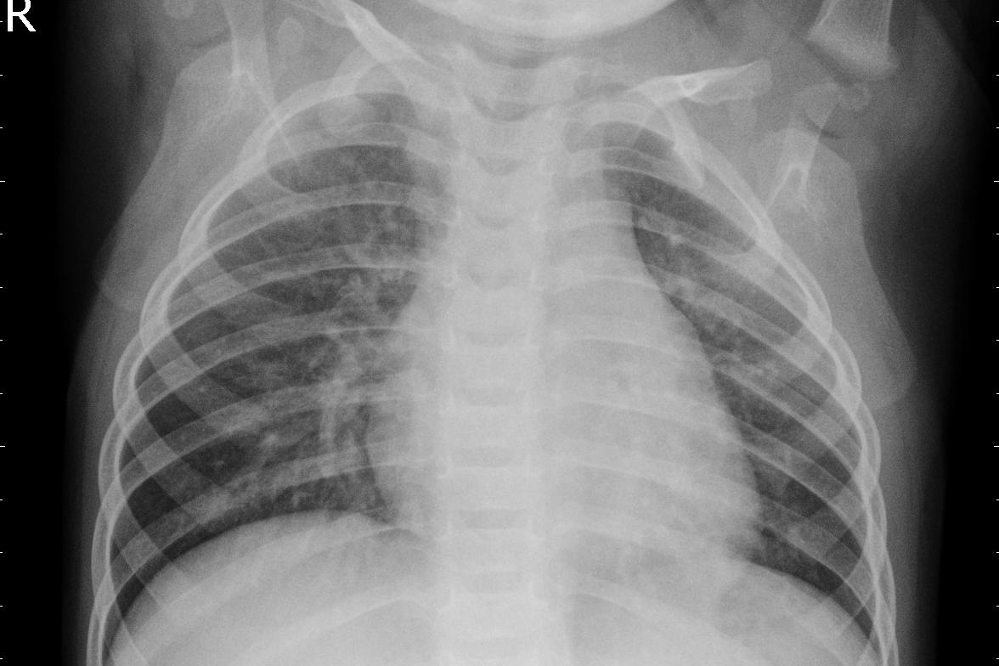

In [1]:
## import based on https://www.kaggle.com/code/lgmoneda/from-image-files-to-numpy-arrays/notebook

import numpy as np
import pandas as pd
import os, sys
from IPython.display import display
from IPython.display import Image as _Imgdis
from PIL import Image

normal_folder = "./dataset/NORMAL"
infected_folder = "./dataset/PNEUMONIA"

normal_files = [f for f in os.listdir(normal_folder) if os.path.isfile(os.path.join(normal_folder, f))]

print("Working with {0} healthy images".format(len(normal_files)))
print("Image examples: ")

for i in range(40, 41):
    print(normal_files[i])
    display(_Imgdis(filename=normal_folder + "/" + normal_files[i], width=240, height=320))
    
infected_files = [f for f in os.listdir(infected_folder) if os.path.isfile(os.path.join(infected_folder, f))]

print("Working with {0} infections".format(len(infected_files)))
print("Image examples: ")

for i in range(40, 41):
    print(infected_files[i])
    display(_Imgdis(filename=infected_folder + "/" + infected_files[i], width=240, height=320))

Just like that, we got images! Now, these images must be resized to perform computations on the entire set. Then, images will be converted into numpy arrays for machines to reduce and understand from numerical data. In addition, we'll convert the image data into normalized, 2D matrices for ease of manipulation. Lastly, the following code will add each image's data into a pandas dataframe with a target designating 0 for healthy and 1 for infected patients. We get the following dataframe, and to prove the images are still accessible. we'll plot the first image directly from the dataframe.

In [2]:
# custom algorithm that resizes images and saves the smaller version in a new directory.

def resize_images(input_folder, output_folder, target_size=(100, 100)):
    if not os.path.exists(output_folder):
        os.makedirs(output_folder)

    for filename in os.listdir(input_folder):
        if filename.endswith('.jpeg'):
            input_file_path = os.path.join(input_folder, filename)
            output_file_path = os.path.join(output_folder, filename)

            with Image.open(input_file_path) as img:
                img.thumbnail(target_size, Image.ANTIALIAS)
                img.save(output_file_path)

normal_resize = "./dataset/normal_resize/"
target_size = (100, 100)

resize_images(normal_folder, normal_resize, target_size)

/var/folders/s3/j5z935293gb554y0mbshh4n00000gn/T/ipykernel_23972/2312735885.py:13: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  img.thumbnail(target_size, Image.ANTIALIAS)


In [3]:
# same thing as above, but for the infected folder. These will be crucial to set our target later.

def resize_images(input_folder, output_folder, target_size=(100, 100)):
    if not os.path.exists(output_folder):
        os.makedirs(output_folder)

    for filename in os.listdir(input_folder):
        if filename.endswith('.jpeg'):
            input_file_path = os.path.join(input_folder, filename)
            output_file_path = os.path.join(output_folder, filename)

            with Image.open(input_file_path) as img:
                img.thumbnail(target_size, Image.ANTIALIAS)
                img.save(output_file_path)

infected_resize = "./dataset/infected_resize/"

resize_images(infected_folder, infected_resize, target_size)

/var/folders/s3/j5z935293gb554y0mbshh4n00000gn/T/ipykernel_23972/1836705684.py:13: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  img.thumbnail(target_size, Image.ANTIALIAS)


                                          image_data  target
1  [[28, 28, 28, 28, 28, 28, 28, 28, 30, 30, 29, ...       0
2  [[85, 56, 52, 74, 88, 94, 101, 104, 114, 138, ...       0
3  [[38, 68, 77, 82, 97, 97, 118, 172, 157, 136, ...       0
4  [[2, 11, 26, 40, 47, 54, 66, 79, 81, 79, 91, 1...       0
5  [[117, 117, 127, 134, 162, 180, 165, 166, 165,...       0
Dataframe contains 5856 images
target
1    4273
0    1583
Name: count, dtype: int64


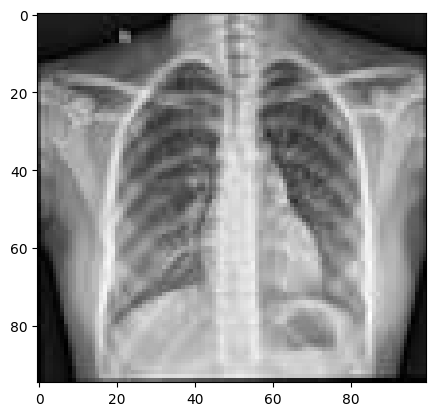

In [4]:
# code recycled and improved from lab 2.

import matplotlib.pyplot as plt
from matplotlib.pyplot import imread

images = pd.DataFrame(columns=["image_data", "target"])
id = 0

# import healthy lung images as numpy arrays into  pandas dataframe
for file in os.listdir(normal_resize):
    id += 1
    img = imread(os.path.join(normal_resize, file))
    img = img.astype(np.uint8)
    images.loc[id] = {"image_data": img, "target": 0}    

# import infected lung images as numpy arrays into  pandas dataframe
for file in os.listdir(infected_resize):
    id += 1
    img = imread(os.path.join(infected_resize, file))
    img = img.astype(np.uint8)
    images.loc[id] = {"image_data": img, "target": 1}    

print(images.head())


print("Dataframe contains {0} images".format(len(images.index)))
print(images['target'].value_counts())

plt.imshow(images.iloc[0]["image_data"], cmap='gray')


Awesome, now we have a table with numerical data for each image, and a target designating the correct diagnosis. We can now set our X and y values to their corresponding values to perform our analysis. In the following code, our data is normalized, converted to grayscale, and set to type float 32. These conversions will ease the calculations that we will perform in this lab.

In [5]:
# custom formatting algorithm for X and y

y = images['target'].to_numpy()

image_data_list = [np.array(Image.fromarray(img).convert('L').resize(target_size)) for img in images['image_data']]
X = np.stack(image_data_list, axis=0)
X = X / 255.0

flattened = []

for j in X: 
    flattened.append(j.flatten())

f = np.array(flattened)


print(f.shape)

(5856, 10000)


## Data Reduction

### Reduction 1: Principal Component Analysis

The first reduction we'll perform on images is an individual PCA reconstruction on the selected image above. This exercise will enable us to understand how PCA uses feature extraction to deconstruct and better understand images. We make a function that takes two arguments: a variable percentage detail for this pca deconstruction, as well an image converted into a numpy array. The function then fits the image into the PCA model by extracting only key features. Then we recreate the same image using only the percentage of features that we call with our function. Lastly, we ask the plot to show the recreated image and we show the following results. Note how the image, pictured in full resolution above, changes with each percentage of components!

In [6]:
# adapted from Dr. Larson's notebook

def plot_explained_variance(pca):
    import plotly
    from plotly.graph_objs import Bar, Line
    from plotly.graph_objs import Scatter, Layout
    from plotly.graph_objs.scatter import Marker
    from plotly.graph_objs.layout import XAxis, YAxis
    plotly.offline.init_notebook_mode() # run at the start of every notebook
    
    explained_var = pca.explained_variance_ratio_
    cum_var_exp = np.cumsum(explained_var)
    
    plotly.offline.iplot({
        "data": [Bar(y=explained_var, name='individual explained variance'),
                 Scatter(y=cum_var_exp, name='cumulative explained variance')
            ],
        "layout": Layout(xaxis=XAxis(title='Principal components'), yaxis=YAxis(title='Explained variance ratio'))
    })
        

In [7]:
from matplotlib import pyplot as plt
from sklearn.decomposition import PCA

n_components = 300

pca = PCA(n_components=n_components)
pca.fit(f)

plot_explained_variance(pca)

By taking a percentage of the image's total components, PCA is able to extract the basic features of an image. In doing so, programs are able to understand and recreate this image based on a smaller set of data. From the example above, we can recreate about 80% of the image with just 30 components. However, we discussed earlier that we need more than that for a medical diagnosis. While we can recreate 90% of the image with 113 components, the desired 95% will require more than 300.

### Reduction 2: Randomized PCA

To speed up the computation of principal components, we can try randomizing the machine's projections. n RPCA, the original high-dimensional data is first projected onto a lower-dimensional subspace using random projections. Then, the PCA is performed on the lower-dimensional data. To do this, we simply set the "svd_solver" parameter inside the PCA object to randomized and evaluate the explained variance between original and reduced images.

In [9]:
rpca = PCA(n_components=n_components, svd_solver='randomized')
rpca.fit(f)

plot_explained_variance(rpca)

From the graph above, we can notice that our results are identical to PCA. The required components for 80%, 90% and 95% of the original representation are exactly the same. However, it is worth noting that RPCA worked slightly faster than PCA - a difference of about 3 seconds. Although this difference in computational efficiency is significant, I do not think it warrants the preference of RPCA for our use case. While the RPCA approach reduces the computational complexity and time, the trade-off is that the resulting principal components might be less accurate than those obtained using the standard PCA method. For a medical diagnosis where human life is at stake, spending the additional computational resources is more than warranted. We simply need to obtain the best results possible.

### Reduction 3: DAISY Feature Extraction

Daisy is an algorithmic extraction process that reduces images based on a number of set parameters. These parameters draw circular graphs over the image which will then be saved as a reduced subset of the original image. While this technique is more advanced than PCA, I believe that reducing medical images may result in the loss of significant details in the original image. This may lead to a diagnosis algorithm to completely ignore some obvious signs of infection. For this reason, I do not believe it shows promise to our prediction task.

Nevertheless, as it is a requirement for this lab, we will encode a daisy algorithm, test it on a single image, use it on the entire set of images, and finally, analyze it's actual results. 

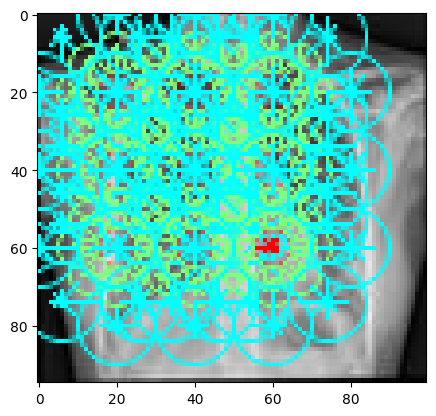

In [12]:
from skimage.feature import daisy

# from Dr. Larson's notebook
features, img_desc = daisy(images.iloc[0]["image_data"], 
                           step=20, 
                           radius=20, 
                           rings=2, 
                           histograms=8, 
                           orientations=8, 
                           visualize=True)
plt.imshow(img_desc)
plt.grid(False)

Here, we can see how Daisy's circles extract data from the image, there seems to be a lot of data loss in this first attempt. For instance, the right lung is largely uncovered, and this may lead to our machine missing some key details for diagnosis. Let's try again with different parameters. Namely, we'll decrease the steps and radius so that we can get a more complete extraction from the X-ray scan.

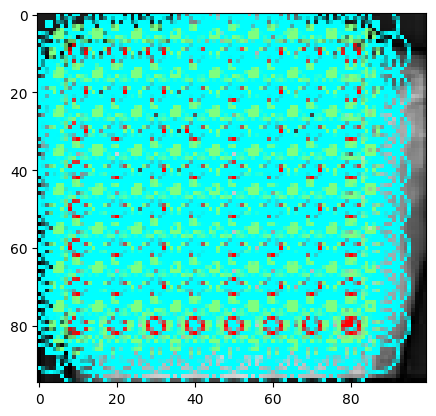

In [22]:
features, img_desc = daisy(images.iloc[0]["image_data"], 
                           step=10, 
                           radius=10, 
                           rings=2, 
                           histograms=8, 
                           orientations=8, 
                           visualize=True)
plt.imshow(img_desc)
plt.grid(False)

Now we can se the DAISY algorithm at work. Essentially, the areas underneath the circles can be saved as an outline of the original image. Because these circles are formatted to contain the majority of the image's important features, it can be an effective way to reduce an X-Ray scan into it's primary components while discarding most of the image, thereby speeding up computation time. Again, while it's an interesting technique for reducing data, I do not think it should be used for medical diagnosis.

Anyway, now it's time to apply daisy to all images by creating a function to extract daisy features from an image. Then, we apply daisy to all images by instantiating a features object and applying our function along the x axis of our dataset using numpy. We can recreate a image using only the features to show how daisy is working. Finally, we'll calculate the pairwise distances for each image and obtain our performance metric, visualizing it on a heatmap.

In [17]:
# adapted from Dr. Larson's notebook

def apply_daisy(row,shape):
    feat = daisy(row.reshape(shape), step=20, radius=20, 
                 rings=2, histograms=8, orientations=4, 
                 visualize=False)
    return feat.reshape((-1))

daisy_features = np.apply_along_axis(apply_daisy, 1, f, (100,100))
print(daisy_features.shape)

(5856, 612)


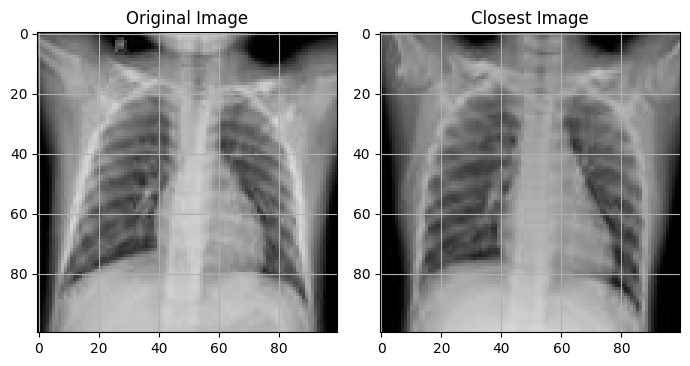

In [24]:
# adapted from Dr. Larson's notebook
from sklearn.metrics.pairwise import pairwise_distances
from skimage.io import imshow

dist_matrix = pairwise_distances(daisy_features)

import copy
idx1 = 5
distances = copy.deepcopy(dist_matrix[idx1,:])
distances[idx1] = np.infty
idx2 = np.argmin(distances)

plt.figure(figsize=(7,10))
plt.subplot(1,2,1)
imshow(X[idx1].reshape((h,w)))
plt.title("Original Image")
plt.grid()

plt.subplot(1,2,2)
imshow(X[idx2].reshape((h,w)))
plt.title("Closest Image")
plt.grid()

Ok great! From this interaction, we can see that daisy is effectively understanding similarities between images. Both lungs are showing infection on the right side — note how the right lung is significantly smaller than the left. These results may show promise to our prediction task. However, daisy is also picking up on unnecessary details which make these images similar, as both patients have the same arms up position in the X-ray scan. These useless details could lead our machine to cluster data based on useless data for our prediction task. Furthermore, I still think that some details may be lost, and this scenario would not be optimal for a healthcare scenario.

Now, to visualize the overall efficacy of this technique, we'll create a heatmap of the pairwise differences of daisy features using seaborn. For simplicity in visualization, we can sort cases along their target value, so we'll know healthy and infected lungs will be clustered together. 

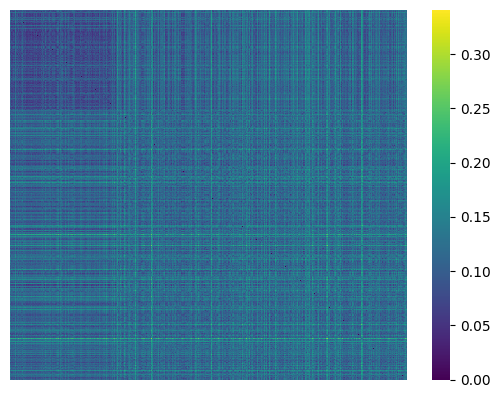

In [29]:
import seaborn as sns

# Create a dataframe with the distances and labels
dist_df = pd.DataFrame(dist_matrix)
dist_df['labels'] = y

# Sort the DataFrame by labels along the rows and colums for easier visualization, then drop label, and convert back to NumPy
sorted_dist_df = dist_df.sort_values('labels', axis=0)
sorted_dist_df = sorted_dist_df[sorted_dist_df.columns[:-1]].reindex(sorted_dist_df['labels'].index, axis=1)
sorted_dist_matrix = sorted_dist_df.to_numpy()

# Create the heatmap
sns.heatmap(sorted_dist_matrix, cmap='viridis', xticklabels=False, yticklabels=False)
plt.show()

From this heatmap we can see that daisy shows mixed results. While the darker area in the top right shows that daisy feature extraction can effectively recognize most negative cases as such — where the target was 0 — the rest of the grid contains enough mixed shades of blue to conceal the distinction between infected and healthy lungs. Of course, these similarities may be due to the nature of an X-Ray scan, but machines that will be used to diagnose disease must have a more clear cut difference between positives and negatives. In addition, the vertical and horizontal grids of yellow and green, even among the dark blue area at the top, are worrisome cases of images that daisy would not be able to classify. The widespread visibility of these cases along the heatmap suggests that daisy is not promising for our prediction task.

### Reduction 4: Gabor Filter

Gabor filters are essentially convolution operations between an image and a generic pattern. By convoluting the image with a desired filter, one can extract more exact features desired from a given image. The following code makes Gabor filters from scratch, which we can then apply to an image. Personally, I do not think this technique is promising to the use case because I believe many of the details about the lungs will be lost in the convolution process. However, it is still worth a try.

1.5140274644582002e-05

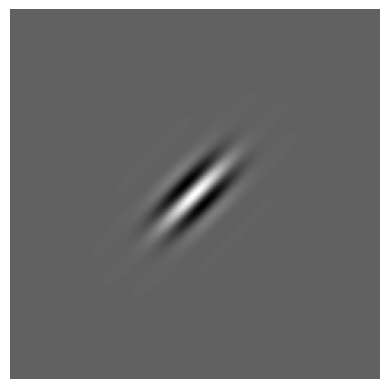

In [30]:
## based on this Jupyter notebook http://vision.psych.umn.edu/users/kersten/kersten-lab/courses/Psy5036W2017/Lectures/17_PythonForVision/Demos/html/2b.Gabor.html
## making our first gabor filter

def myimshow(I, **kwargs):
    # utility function to show image
    plt.figure();
    plt.axis('off')
    plt.imshow(I, cmap=plt.gray(), **kwargs)


def genGabor(sz, omega, theta, func=np.cos, K=np.pi):
    radius = (int(sz[0]/2.0), int(sz[1]/2.0))
    [x, y] = np.meshgrid(range(-radius[0], radius[0]+1), range(-radius[1], radius[1]+1))

    x1 = x * np.cos(theta) + y * np.sin(theta)
    y1 = -x * np.sin(theta) + y * np.cos(theta)
    
    gauss = omega**2 / (4*np.pi * K**2) * np.exp(- omega**2 / (8*K**2) * ( 4 * x1**2 + y1**2))
#     myimshow(gauss)
    sinusoid = func(omega * x1) * np.exp(K**2 / 2)
#     myimshow(sinusoid)
    gabor = gauss * sinusoid
    return gabor
        
g = genGabor((256,256), 0.3, np.pi/4, func=np.cos) 
# change func to "cos", "sin" can generate sin gabor or cos gabor, here we pass a function name as a parameter
myimshow(g)
np.mean(g)

<Figure size 640x480 with 0 Axes>

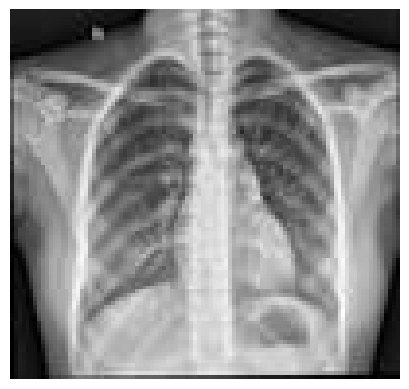

<Figure size 640x480 with 0 Axes>

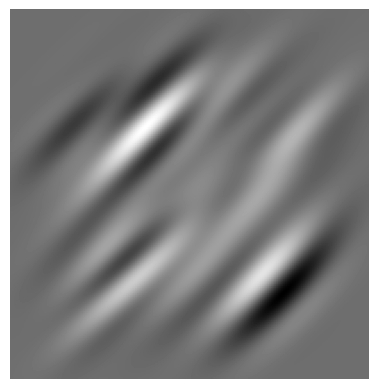

In [42]:
from scipy.signal import convolve2d
xray = images.iloc[0]["image_data"]
plt.figure(); myimshow(xray)
res = convolve2d(xray, g, mode='valid')
plt.figure(); myimshow(res);

As we can see, the filtered image does not contain any actionable information for medical diagnosis. A more experienced computer scientist with domain knowledge could potentially fine tune a Gabor filter that will expound the signs of infection among positive cases. However, given the different kinds of pneumonia and the different locations of possible infection, these filters do not show promise in the clinical context.

To apply this filter to the entire dataset, we first define a function to convolve the image and calculate the magnitude. Then, we'll loop through the original dataframe to apply the above filter to every image and store the magnitude, which we can use to calculate the pairwise distance so that we can analyze the viability of this technique.

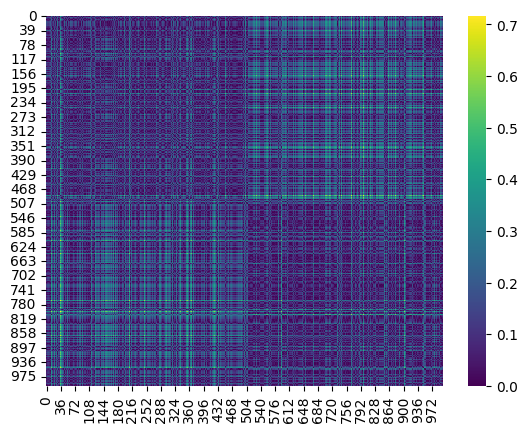

In [54]:
# Create function to apply Gabor filter to an images
def apply_filter(image, gabor_filter):
    response = convolve2d(image, gabor_filter, mode='valid')
    magnitude = np.sqrt(response**2)
    return np.mean(magnitude)

# algorithm to select a sample of 500 images for each target class
# included becayse I ran the full dataset and my computer took half an hour to return an error... This should speed up calculations.
# Also, I'm using the original dataframe instead of X and y because the target and the image data must correspond for both selection and visualization.
samples = 500
selected_indices = images.groupby('target').head(samples).index
selected_images = images.loc[selected_indices]

# Convert the images to grayscale and resize them again. This was causing the error before, as not all X-ray scans are grayscale.
target_size = (100, 100)
image_data_list = [np.array(Image.fromarray(img).convert('L').resize(target_size)) for img in selected_images['image_data']]
X_selected = np.stack(image_data_list, axis=0)
X_selected = X_selected / 255.0
y_selected = selected_images['target'].to_numpy()

# Apply Gabor filter to images and store the magnitudes inside array
response_magnitudes = []
for image in X_selected:
    response = apply_filter(image, g)
    response_magnitudes.append(response)

# Calculate pairwise distances between magnitudes
response_magnitudes = np.array(response_magnitudes).reshape(-1, 1)
dist_matrix_gabor = pairwise_distances(response_magnitudes)

# Create heatmap to visualize the pairwise distances
ordered_idx = np.argsort(y_selected)
sns.heatmap(dist_matrix_gabor[ordered_idx][:, ordered_idx], cmap='viridis')
plt.show()

Well, our final results turned out to be very interesting. Based on the darker and lighter shades corresponding to different target values, there seems to be a tangible pattern recognition from applying Gabor filters to the images. I believe that a more fine-tuned version of the filter may cause these shade differences to become even more stark. However, the same problems as daisy also apply here. It's problematic that the entire heatmap contains shades of blue, indicating the differences are not easily recognizable. Again, this may be due to the similarities between all chest X-ray scans. In addition, the presence of the yellow-green grid across the entire map is also problematic, indicating that many images will not be discernible to diagnose using this technique. Because medicine requires high degrees of certainty, I cannot recommend this approach for use in the field.